In [169]:
using Plots

#utworzenie tablicy będącej bazą dla animacji
#pierwsza liczba w krotce oznacza obecność ludzi: 0 - brak człowieka, 1- człowiek zdrowy, 2 - człowiek chory 3 - ozdrowieniec
#druga liczba oznacza odporność - szansę, że do zarażenia nie dojdzie pomimo wystawienia na czynnik chorobotwórczy
#trzecia liczba oznacza 
matrix = [[[0,0,0] for x in 1:map_width] for y in 1:map_height]

#początkowe dane symulacji:
total_number = initial_number # liczba wszystkich osób
healthy_number = initial_number - 1 # liczba osób zdrowych, nieodpornych
ill_number = 1 # liczba osób chorych
immune_number = 0 #liczba osób zdrowych odpornych

#początkowe ustawienie ludzi na losowych pozycjach
function initial_place()
    free_positions = [[[0,0] for x in 1:map_width] for y in 1:map_height]
    for i in 1:map_height
        for j in 1:map_width
            free_positions[i][j][1] = i
            free_positions[i][j][2] = j
        end
    end
    for i in 1:initial_number
        random_row = rand(1:length(free_positions))
        random_column = rand(1:length(free_positions[random_row]))
        new_row = free_positions[random_row][random_column][1]
        new_column = free_positions[random_row][random_column][2]
        if(i == 1)
            matrix[new_row][new_column] = [2, 0, cure_time]
        else
            matrix[new_row][new_column] = [1, 0, 0]
        end
        
        deleteat!(free_positions[random_row], random_column)        
        if(length(free_positions[random_row]) == 0)
            deleteat!(free_positions, random_row)
        end
    end
end

function move_people()
    possible_directions = [[0, -1], [-1,-1], [-1, 0], [-1, 1], [0, 1], [1,1], [1, 0], [1, -1]]
    for i in 1:map_height
        for j in 1:map_width
            if(matrix[i][j][1] > 0)
                free_directions = Tuple{Int, Int}[]
                for k in 1:8
                    new_i = mod(i + possible_directions[k][1] - 1, map_height) + 1
                    new_j = mod(j + possible_directions[k][2] - 1, map_width) + 1
                    if(matrix[new_i][new_j][1] == 0)
                        push!(free_directions, (new_i, new_j))
                    end
                end
                if(length(free_directions) > 0)
                    new_direction = rand(1:length(free_directions))
                    new_i = free_directions[new_direction][1]
                    new_j = free_directions[new_direction][2]
                    matrix[new_i][new_j][2] = matrix[i][j][2]
                    matrix[new_i][new_j][1] = matrix[i][j][1]
                    matrix[new_i][new_j][3] = matrix[i][j][3]
                    matrix[i][j][1] = 0
                    matrix[i][j][2] = 0
                    matrix[i][j][3] = 0
                end
            end
        end
    end
end

function infecting()
    global total_number
    global ill_number
    global healthy_number
    global immune_number
    possible_directions = [[0, -1], [-1,-1], [-1, 0], [-1, 1], [0, 1], [1,1], [1, 0], [1, -1]]
    for i in 1:map_height
        for j in 1:map_width
            if(matrix[i][j][1] == 2)
                for k in 1:8
                    nei_i = mod(i + possible_directions[k][1] - 1, map_height) + 1
                    nei_j = mod(j + possible_directions[k][2] - 1, map_width) + 1
                    if(matrix[nei_i][nei_j][1] == 1 || matrix[nei_i][nei_j][1] == 3)
                        chance = rand(1:1000)
                        if(chance < contagiousness*1000)
                            attack = rand(0:100)
                            if(attack > matrix[nei_i][nei_j][2])
                                ill_number += 1
                                if(matrix[nei_i][nei_j][1] == 3)
                                    immune_number -= 1
                                else
                                    healthy_number -= 1
                                end
                                matrix[nei_i][nei_j][1] = 2
                                matrix[nei_i][nei_j][3] = cure_time
                            end
                        end
                    end
                end
                if(matrix[i][j][3] == 0)
                    chance = rand(1:1000)
                    ill_number -= 1
                    if(chance < death_chance*1000)
                        matrix[i][j][1] = 0
                        matrix[i][j][2] = 0
                        total_number -= 1
                    else
                        matrix[i][j][1] = 3
                        matrix[i][j][2] = 100
                        immune_number += 1
                    end
                end
            end
            if(matrix[i][j][3] > 0)
                matrix[i][j][3] -= 1
            end
            if(matrix[i][j][2] > 0)
                matrix[i][j][2] -= immunity_loose
                if(matrix[i][j][2] < 40 && matrix[i][j][1] == 3)
                    matrix[i][j][1] = 1
                    healthy_number += 1
                    immune_number -= 1
                end
            end
        end
    end
end

function tmp(x, y)
    matrix[x][y][1]
end



tmp (generic function with 1 method)

## Na poniższych animacjach, ludzie są oznaczeni w postaci wartości: 1 - osoba zdrowa, nieodporna; 2 - osoba chora; 3 - osoba zdrowa, odporna

## Wariant nr 1

Choroba o niskiej śmiertelności i zaraźliwości. Ozdrowieńcy uzyskują odporność na długi czas

┌ Info: Saved animation to 
│   fn = C:\Users\Krzysztof\anim_fps15.gif
└ @ Plots C:\Users\Krzysztof\.julia\packages\Plots\SjqWU\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Krzysztof\\anim_fps15.gif")
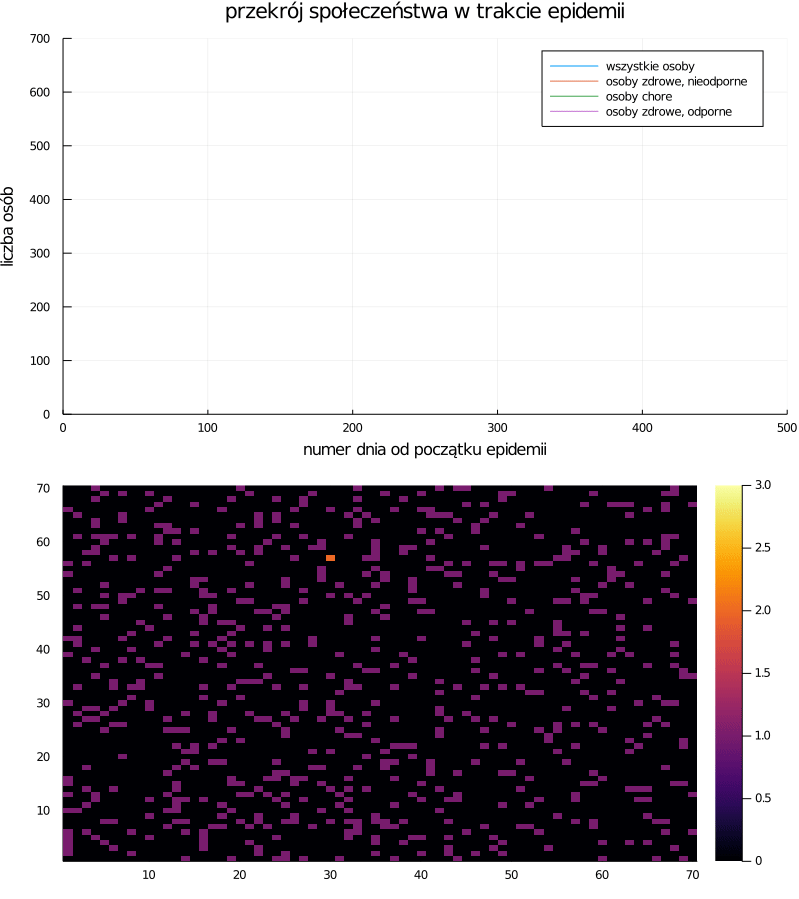

In [177]:
matrix = [[[0,0,0] for x in 1:map_width] for y in 1:map_height]

#dane początkowe:
contagiousness = 0.2 # szansa na zarażenie w przypadku kontaktu
cure_time = 21 # czas zdrowienia, w którym chory może zarażać
immunity_loose = 1 # dzienna utrata odporności w %
death_chance = 0.1 # szansa na śmierć z powodu choroby
initial_number = 700 # początkowa liczba osób
map_width = 70 # szerokośc mapy
map_height = 70 #wysokość mapy
animation_frames = 500 # ilość dni symulacji

total_number = initial_number # liczba wszystkich osób
healthy_number = initial_number - 1 # liczba osób zdrowych, nieodpornych
ill_number = 1 # liczba osób chorych
immune_number = 0 #liczba osób zdrowych odpornych

initial_place()
total_array = []
healthy_array = []
ill_array = []
immune_array = []

anim = @animate for i in 1:animation_frames
    move_people()
    infecting()
    push!(total_array, total_number)
    push!(healthy_array, healthy_number)
    push!(ill_array, ill_number)
    push!(immune_array, immune_number)
    xs = [x for x in 1:i]
    plot(xs, total_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="wszystkie osoby")
    plot!(xs, healthy_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="osoby zdrowe, nieodporne")
    plot!(xs, ill_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="osoby chore")
    p1 = plot!(xs, immune_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="osoby zdrowe, odporne", title="przekrój społeczeństwa w trakcie epidemii", xlabel="numer dnia od początku epidemii", ylabel="liczba osób")
    p2 = heatmap([x for x in 1:map_width], [y for y in 1:map_height], tmp, clim=(0, 3))
    plot(p1, p2, layout = (2,1), size=[800, 900])
end
gif(anim, "anim_fps15.gif", fps = 15)

## Wariant 2

Choroba o bardzo niskiej śmiertelności i wysokiej zaraźliwości. Ozdrowieńcy uzyskują odporność na długi czas. Chory może zarażać przez 3 tygodnie.

┌ Info: Saved animation to 
│   fn = C:\Users\Krzysztof\anim_fps15.gif
└ @ Plots C:\Users\Krzysztof\.julia\packages\Plots\SjqWU\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Krzysztof\\anim_fps15.gif")
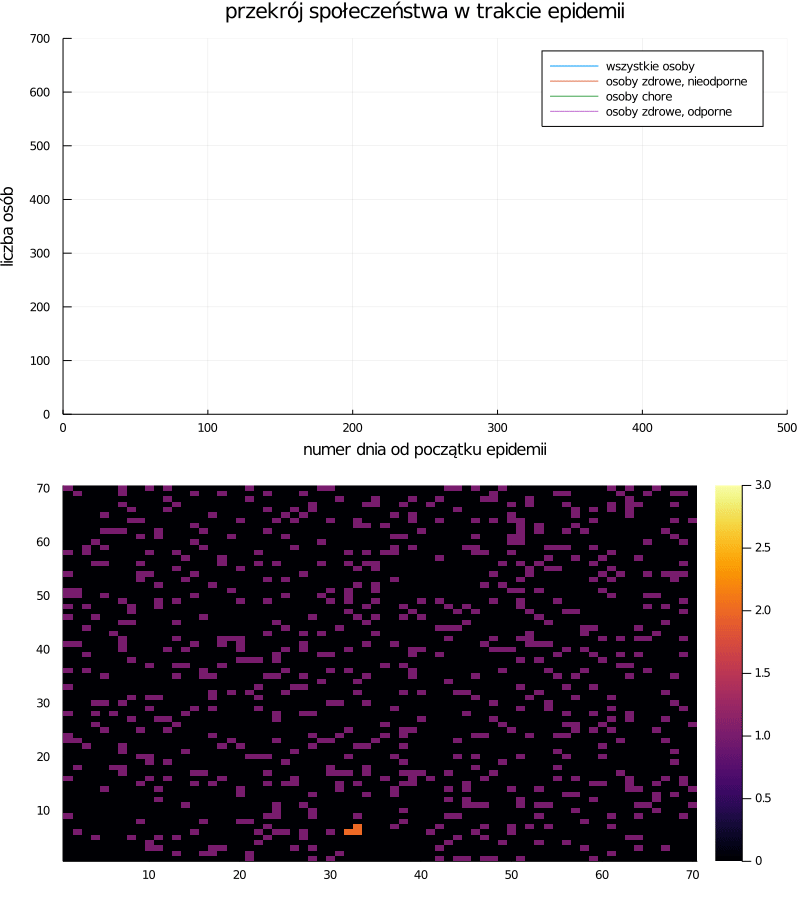

In [175]:
matrix = [[[0,0,0] for x in 1:map_width] for y in 1:map_height]

#dane początkowe:
contagiousness = 0.6 # szansa na zarażenie w przypadku kontaktu
cure_time = 21 # czas zdrowienia, w którym chory może zarażać
immunity_loose = 1 # dzienna utrata odporności w %
death_chance = 0.05 # szansa na śmierć z powodu choroby
initial_number = 700 # początkowa liczba osób
map_width = 70 # szerokośc mapy
map_height = 70 #wysokość mapy
animation_frames = 500 # ilość dni symulacji

total_number = initial_number # liczba wszystkich osób
healthy_number = initial_number - 1 # liczba osób zdrowych, nieodpornych
ill_number = 1 # liczba osób chorych
immune_number = 0 #liczba osób zdrowych odpornych

initial_place()
total_array = []
healthy_array = []
ill_array = []
immune_array = []
anim = @animate for i in 1:animation_frames
    move_people()
    infecting()
    push!(total_array, total_number)
    push!(healthy_array, healthy_number)
    push!(ill_array, ill_number)
    push!(immune_array, immune_number)
    xs = [x for x in 1:i]
    plot(xs, total_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="wszystkie osoby")
    plot!(xs, healthy_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="osoby zdrowe, nieodporne")
    plot!(xs, ill_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="osoby chore")
    p1 = plot!(xs, immune_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="osoby zdrowe, odporne", title="przekrój społeczeństwa w trakcie epidemii", xlabel="numer dnia od początku epidemii", ylabel="liczba osób")
    p2 = heatmap([x for x in 1:map_width], [y for y in 1:map_height], tmp, clim=(0, 3))
    plot(p1, p2, layout = (2,1), size=[800, 900])
end
gif(anim, "anim_fps15.gif", fps = 15)

## Wariant 3

Choroba o wysokiej zaraźliwości i wysokiej śmiertelności. Ozdrowieńcy szybko tracą odporność. Chorzy mogą zarażać przez 2 tygodnie

┌ Info: Saved animation to 
│   fn = C:\Users\Krzysztof\anim_fps15.gif
└ @ Plots C:\Users\Krzysztof\.julia\packages\Plots\SjqWU\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Krzysztof\\anim_fps15.gif")
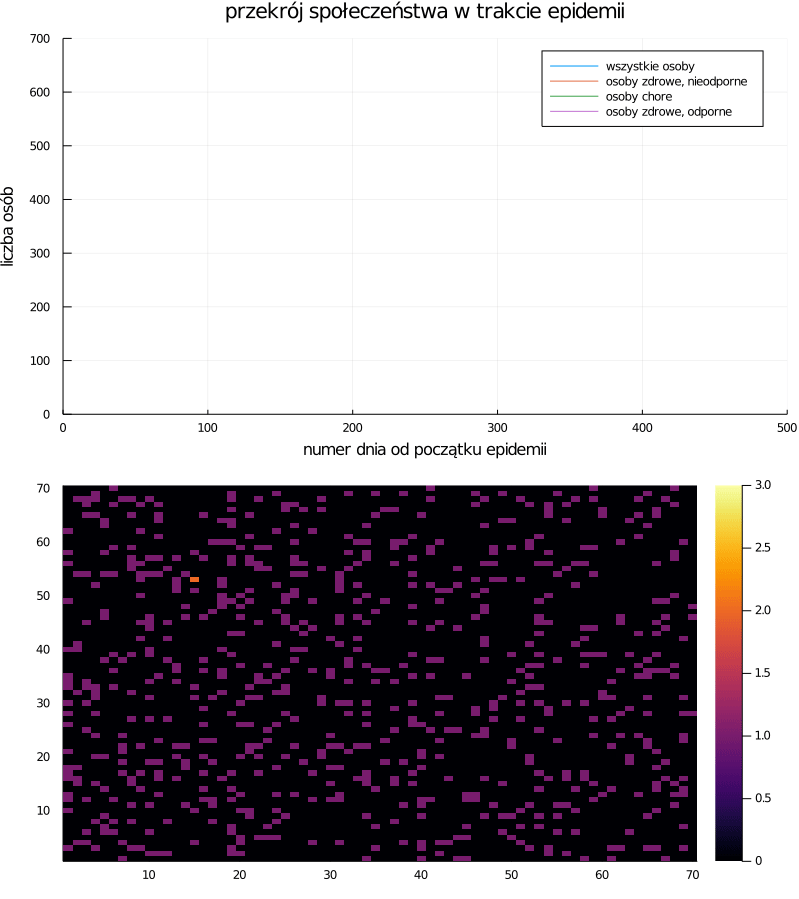

In [176]:
matrix = [[[0,0,0] for x in 1:map_width] for y in 1:map_height]

#dane początkowe:
contagiousness = 0.5 # szansa na zarażenie w przypadku kontaktu
cure_time = 14 # czas zdrowienia, w którym chory może zarażać
immunity_loose = 4 # dzienna utrata odporności w %
death_chance = 0.5 # szansa na śmierć z powodu choroby
initial_number = 700 # początkowa liczba osób
map_width = 70 # szerokośc mapy
map_height = 70 #wysokość mapy
animation_frames = 500 # ilość dni symulacji

total_number = initial_number # liczba wszystkich osób
healthy_number = initial_number - 1 # liczba osób zdrowych, nieodpornych
ill_number = 1 # liczba osób chorych
immune_number = 0 #liczba osób zdrowych odpornych

initial_place()
total_array = []
healthy_array = []
ill_array = []
immune_array = []
anim = @animate for i in 1:animation_frames
    move_people()
    infecting()
    push!(total_array, total_number)
    push!(healthy_array, healthy_number)
    push!(ill_array, ill_number)
    push!(immune_array, immune_number)
    xs = [x for x in 1:i]
    plot(xs, total_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="wszystkie osoby")
    plot!(xs, healthy_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="osoby zdrowe, nieodporne")
    plot!(xs, ill_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="osoby chore")
    p1 = plot!(xs, immune_array, xlim=(0,animation_frames), ylim=(0, initial_number), label="osoby zdrowe, odporne", title="przekrój społeczeństwa w trakcie epidemii", xlabel="numer dnia od początku epidemii", ylabel="liczba osób")
    p2 = heatmap([x for x in 1:map_width], [y for y in 1:map_height], tmp, clim=(0, 3))
    plot(p1, p2, layout = (2,1), size=[800, 900])
end
gif(anim, "anim_fps15.gif", fps = 15)